## **Importing required libraries:**

In [52]:
import numpy as np
import cv2
import random
import math
import os
import time
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt


***

## **Question 1:**
#### Step 1: loading Images with OpenCV library and also categorize them to colored and gray images.

In [53]:
images = dict()
for i in ["images", "grayImages"]:
    folderPath = "F:/uni/Term7/AI/homeWorks/HW3"+"/"+i
    images[i] = []
    for fileName in os.listdir(folderPath):
        filePath = os.path.join(folderPath, fileName)
        if os.path.isfile(filePath):
            img = cv2.imread(filePath)
            images[i].append(img)
print(images["images"][0].shape)

(150, 150, 3)


In [54]:
coloredImages = np.array(images["images"])
grayImages = np.array(images["grayImages"])
grayImages[0][0]

array([[ 97,  97,  97],
       [ 85,  85,  85],
       [108, 108, 108],
       [124, 124, 124],
       [123, 123, 123],
       [173, 173, 173],
       [191, 191, 191],
       [198, 198, 198],
       [195, 195, 195],
       [195, 195, 195],
       [164, 164, 164],
       [109, 109, 109],
       [140, 140, 140],
       [159, 159, 159],
       [182, 182, 182],
       [187, 187, 187],
       [181, 181, 181],
       [160, 160, 160],
       [172, 172, 172],
       [162, 162, 162],
       [157, 157, 157],
       [136, 136, 136],
       [143, 143, 143],
       [192, 192, 192],
       [169, 169, 169],
       [162, 162, 162],
       [176, 176, 176],
       [159, 159, 159],
       [162, 162, 162],
       [156, 156, 156],
       [158, 158, 158],
       [142, 142, 142],
       [168, 168, 168],
       [176, 176, 176],
       [146, 146, 146],
       [140, 140, 140],
       [211, 211, 211],
       [ 86,  86,  86],
       [125, 125, 125],
       [194, 194, 194],
       [161, 161, 161],
       [168, 168

As we can see gray images have the exact same RGB elements.

we use 8 thresholds as default:

[0:31]

[32:63]

[64:95]

[96:127]

[128:159]

[160:191]

[192:223]

[224:255]

and we save each threshold images into a separated folder named result.

In [55]:
for i in range(10):
    hsv_image = cv2.cvtColor(coloredImages[i], cv2.COLOR_RGB2HSV)
    v_channel = hsv_image[:, :, 2]
    
    threshold_img = np.zeros_like(v_channel)
    threshold_img[np.where(v_channel < 32)] = 0
    threshold_img[np.where((v_channel >= 32) & (v_channel < 64))] = 32
    threshold_img[np.where((v_channel >= 64) & (v_channel < 96))] = 64
    threshold_img[np.where((v_channel >= 96) & (v_channel < 128))] = 96
    threshold_img[np.where((v_channel >= 128) & (v_channel < 160))] = 128
    threshold_img[np.where((v_channel >= 160) & (v_channel < 192))] = 160
    threshold_img[np.where((v_channel >= 192) & (v_channel < 224))] = 192
    threshold_img[np.where(v_channel >= 224)] = 255
    cv2.imwrite(f"F:/uni/Term7/AI/homeWorks/HW3/result/threshold_img{i}.png", threshold_img)


## **Step 3:**
#### simulated annealing implementation as we did earlier in previous home work with a few adjustment for thresholding problem.

In [56]:

class SimulatedAnnealing:
    def __init__(self, images, grayscale_images, initial_threshold, threshold_num=7, max_iterations=1000, initial_temperature=100, cooling_rate=0.95):
        self.threshold_num = threshold_num
        self.images = images
        self.grayscale_images = grayscale_images
        self.current_threshold = initial_threshold
        self.best_threshold = initial_threshold
        self.best_error = self.calculate_total_error(initial_threshold)
        self.max_iterations = max_iterations
        self.temperature = initial_temperature
        self.cooling_rate = cooling_rate
        self.threshold_num = threshold_num

    def calculate_total_error(self, threshold):
        total_error = 0
        for img, gt in zip(self.images, self.grayscale_images):
            
            hsv_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
            v_channel = hsv_image[:, :, 2]
            threshold_img = np.zeros_like(v_channel)
            
            threshold_img[np.where(v_channel < threshold[0])] = 0
            for i in range(self.threshold_num - 1):
                threshold_img[np.where((v_channel >= threshold[i]) & (v_channel < threshold[i+1]))] = threshold[i+1]
            threshold_img[np.where(v_channel >= threshold[self.threshold_num - 1])] = 255
            # rgb_image = cv2.cvtColor(threshold_img, cv2.COLOR_GRAY2BGR)
            error = np.mean(np.abs(threshold_img - gt[:, :, 0]))
            total_error += error
        return total_error

    def boltzmann_factor(self, new_error):
        delta_error = new_error - self.best_error
        return math.exp(-delta_error / self.temperature) if delta_error > 0 else 1

    def optimize(self):
        for _ in range(self.max_iterations):
            new_threshold = self.current_threshold.copy()
            for i in range(self.threshold_num):
                prev = new_threshold[i]
                r = random.randint(-3, 3)
                if new_threshold[i]+r < 0 or new_threshold[i]+r > 255 or new_threshold[i]+r in new_threshold:
                    new_threshold[i] = prev
                else:
                    new_threshold[i] += r
            new_threshold.sort()
            
            new_error = self.calculate_total_error(new_threshold)
            
            if random.random() < self.boltzmann_factor(new_error):
                self.current_threshold = new_threshold
            if new_error < self.best_error:
                self.best_threshold = new_threshold
                self.best_error = new_error
            self.temperature *= self.cooling_rate
            if self.temperature < 1e-3:
                break
        
        return self.best_threshold, self.best_error
    

## **Step 4: fine tuning parameters in simulated annealing**
#### choosing number of thresholds:

In [57]:
for x in [4, 8, 16, 32]:
    start = time.time()
    t = [i*int(256/x) for i in range(1, x)]
    simulated_annealing = SimulatedAnnealing(coloredImages, grayImages, t, initial_temperature=1000, max_iterations=1000, cooling_rate=0.95, threshold_num=x-1)
    finalThresholds, minError = simulated_annealing.optimize()
    end = time.time()
    print(f"minimum error for {x} thresholds: {minError} and it took {end-start} seconds.")

minimum error for 4 thresholds: 688.8484000000001 and it took 3.792665958404541 seconds.
minimum error for 8 thresholds: 325.0000444444445 and it took 4.265963792800903 seconds.
minimum error for 16 thresholds: 285.30737777777773 and it took 7.124054431915283 seconds.
minimum error for 32 thresholds: 209.9205777777778 and it took 14.179840087890625 seconds.


**As we can see the higher the threshold the lower error we get but it gets more time to compute the result and converge.**

***


**choosing initial temperature:**

In [58]:
for inTemp in [100, 1000, 10000, 100000]:
    x = 8
    start = time.time()
    t = [i*int(256/x) for i in range(1, x)]
    simulated_annealing = SimulatedAnnealing(coloredImages, grayImages, t, initial_temperature=inTemp, max_iterations=1000, cooling_rate=0.95, threshold_num=x-1)
    finalThresholds, minError = simulated_annealing.optimize()
    end = time.time()
    print(f"minimum error for initial_temperature={inTemp} : {minError} and it took {end-start} seconds.")

minimum error for initial_temperature=100 : 325.7840888888889 and it took 3.936753988265991 seconds.
minimum error for initial_temperature=1000 : 327.2417777777777 and it took 4.681610584259033 seconds.
minimum error for initial_temperature=10000 : 341.2650666666667 and it took 5.0219690799713135 seconds.
minimum error for initial_temperature=100000 : 360.3501777777778 and it took 6.107393264770508 seconds.


***it seems higher temperature leads to better performance but it doesn't affect that much, so we continue with 1000 which is a reasonable value for that parameter***
***

**choosing cooling rate:**

In [59]:
for coolingRate in [0.8, 0.9, 0.92, 0.95, 0.99]:
    x = 8
    start = time.time()
    t = [i*int(256/x) for i in range(1, x)]
    simulated_annealing = SimulatedAnnealing(coloredImages, grayImages, t, initial_temperature=1000, max_iterations=1000, cooling_rate=coolingRate, threshold_num=x-1)
    finalThresholds, minError = simulated_annealing.optimize()
    end = time.time()
    print(f"minimum error for cooling_rate={coolingRate} : {minError} and it took {end-start} seconds.")

minimum error for cooling_rate=0.8 : 332.53515555555555 and it took 0.9832761287689209 seconds.
minimum error for cooling_rate=0.9 : 328.17942222222223 and it took 2.534785747528076 seconds.
minimum error for cooling_rate=0.92 : 325.54911111111113 and it took 2.6881699562072754 seconds.
minimum error for cooling_rate=0.95 : 444.5696 and it took 4.776543855667114 seconds.
minimum error for cooling_rate=0.99 : 375.6732444444444 and it took 17.566161632537842 seconds.


***As we can see the higher the cooling rate the more time it takes to converge, cooling rate around 0.95 seems to be a reasonable choice.***
***

### **choosing number of iteration:**

In [60]:
for maxItr in [10, 100, 1000, 10000, 100000, 1000000]:
    x = 8
    start = time.time()
    t = [i*int(256/x) for i in range(1, x)]
    simulated_annealing = SimulatedAnnealing(coloredImages, grayImages, t, initial_temperature=1000, max_iterations=maxItr, cooling_rate=0.95, threshold_num=x-1)
    finalThresholds, minError = simulated_annealing.optimize()
    end = time.time()
    print(f"minimum error for max_iteration={maxItr} : {minError} and it took {end-start} seconds.")

minimum error for max_iteration=10 : 458.1015999999999 and it took 0.15774941444396973 seconds.
minimum error for max_iteration=100 : 425.72204444444446 and it took 1.848290205001831 seconds.
minimum error for max_iteration=1000 : 457.96955555555553 and it took 5.0792412757873535 seconds.
minimum error for max_iteration=10000 : 325.55102222222223 and it took 4.592926263809204 seconds.
minimum error for max_iteration=100000 : 403.26013333333333 and it took 4.496087074279785 seconds.
minimum error for max_iteration=1000000 : 325.0145777777778 and it took 4.752532243728638 seconds.


***As we can see the usually higher number of  max iterations doesn't affect the result. so we choose the smallest value which is the upper bound and it is 1000.***
***

### **Bring it all together:**
***finally we run the method with above parameters and save the results in the result folder.***

In [61]:
x = 8
start = time.time()
t = [i*int(256/x) for i in range(1, x)]
simulated_annealing = SimulatedAnnealing(coloredImages, grayImages, t, initial_temperature=1000, max_iterations=1000, cooling_rate=0.95, threshold_num=x-1)
finalThresholds, minError = simulated_annealing.optimize()
end = time.time()
print(f"minimum error: {minError} and it took {end-start} seconds.")

minimum error: 442.88737777777783 and it took 4.752622604370117 seconds.


In [62]:
print("final thresholds: ", finalThresholds)
print("final error: ", minError)

final thresholds:  [29, 69, 95, 119, 155, 191, 223]
final error:  442.88737777777783


In [63]:
result = []
for i in range(10):
    hsv_image = cv2.cvtColor(coloredImages[i], cv2.COLOR_RGB2HSV)
    v_channel = hsv_image[:, :, 2]
    
    threshold_img = np.zeros_like(v_channel)
    
    threshold_img[np.where(v_channel < finalThresholds[0])] = 0
    for j in range(x - 2):
        threshold_img[np.where((v_channel >= finalThresholds[j]) & (v_channel < finalThresholds[j+1]))] = finalThresholds[j]
    threshold_img[np.where(v_channel >= finalThresholds[x-2])] = 255
    result.append(threshold_img)
    cv2.imwrite(f"F:/uni/Term7/AI/homeWorks/HW3/result/threshold_img{i}.png", threshold_img)

***

## **Showing results:**
#### ***we used 8 thresholds and we as we can see most of the results are close enough and is well presented***

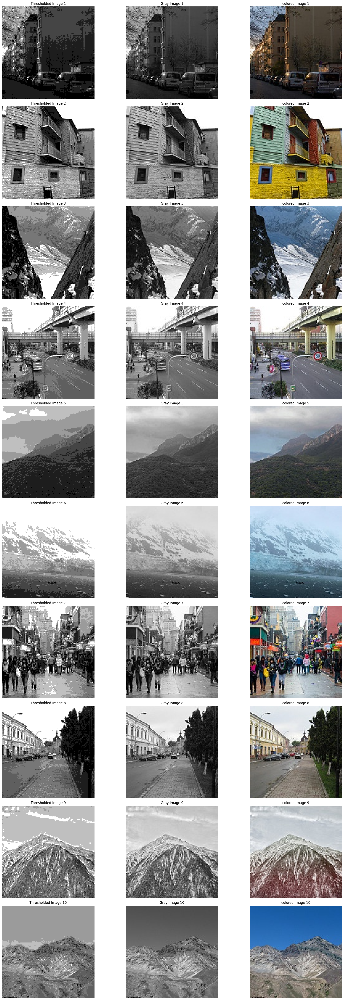

In [64]:
num_images = len(coloredImages)
fig, axes = plt.subplots(num_images, 3, figsize=(20, num_images * 5))

for i in range(num_images):
    rgb_image = cv2.cvtColor(result[i], cv2.COLOR_GRAY2BGR)
    axes[i, 0].imshow(rgb_image)
    axes[i, 0].set_title(f'Thresholded Image {i+1}')
    axes[i, 0].axis('off')

    axes[i, 1].imshow(grayImages[i])
    axes[i, 1].set_title(f'Gray Image {i+1}')
    axes[i, 1].axis('off')
    
    rgb_image = cv2.cvtColor(coloredImages[i], cv2.COLOR_RGB2BGR)
    axes[i, 2].imshow(rgb_image)
    axes[i, 2].set_title(f'colored Image {i+1}')
    axes[i, 2].axis('off')
    
plt.tight_layout()
plt.show()

***

## **Question 2:**

#### ***Here I defined some functions for loading images, k-means clustering, segmenting the image and the final function is for choosing the right k for the problem. i tested k = 2 to k = 13 for each image separately.***

In [65]:
def load_images(image):
    pixel_data = []
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    pixel_data.append(image.reshape((-1, 3)))
    pixel_data = np.vstack(pixel_data)
    return pixel_data

def kmeans_clustering_sklearn(pixel_data, k):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    label = kmeans.fit_predict(pixel_data)
    center = np.uint8(kmeans.cluster_centers_)
    return label, center

def segment_images(image, label, center):
    start = 0
    num_pixels = image.shape[0] * image.shape[1]
    segmented_data = center[label[start:start + num_pixels].flatten()]
    segmented_image = segmented_data.reshape(image.shape)
    start += num_pixels
    return segmented_image

def chooseK(img):
    pixel_data = load_images(img)
    num_images = 3
    _, axes = plt.subplots(num_images, 4, figsize=(20, num_images * 3))
    for i in range(num_images):
        k = (i*4)+2
        label, center = kmeans_clustering_sklearn(pixel_data, k)
        segmented_image = segment_images(coloredImages[0], label, center)
        
        axes[i, 0].imshow(segmented_image)
        axes[i, 0].set_title(f' K={k}')
        axes[i, 0].axis('off')
        
        k = (i*4)+3
        label, center = kmeans_clustering_sklearn(pixel_data, k)
        segmented_image = segment_images(coloredImages[0], label, center)

        axes[i, 1].imshow(segmented_image)
        axes[i, 1].set_title(f'K={k}')
        axes[i, 1].axis('off')
        
        k = (i*4)+4
        label, center = kmeans_clustering_sklearn(pixel_data, k)
        segmented_image = segment_images(coloredImages[0], label, center)
        
        axes[i, 2].imshow(segmented_image)
        axes[i, 2].set_title(f'K={k}')
        axes[i, 2].axis('off')
        
        k = (i*4)+5
        label, center = kmeans_clustering_sklearn(pixel_data, k)
        segmented_image = segment_images(coloredImages[0], label, center)
        
        axes[i, 3].imshow(segmented_image)
        axes[i, 3].set_title(f'K={k}')
        axes[i, 3].axis('off')
        
    plt.tight_layout()
    plt.show()


***

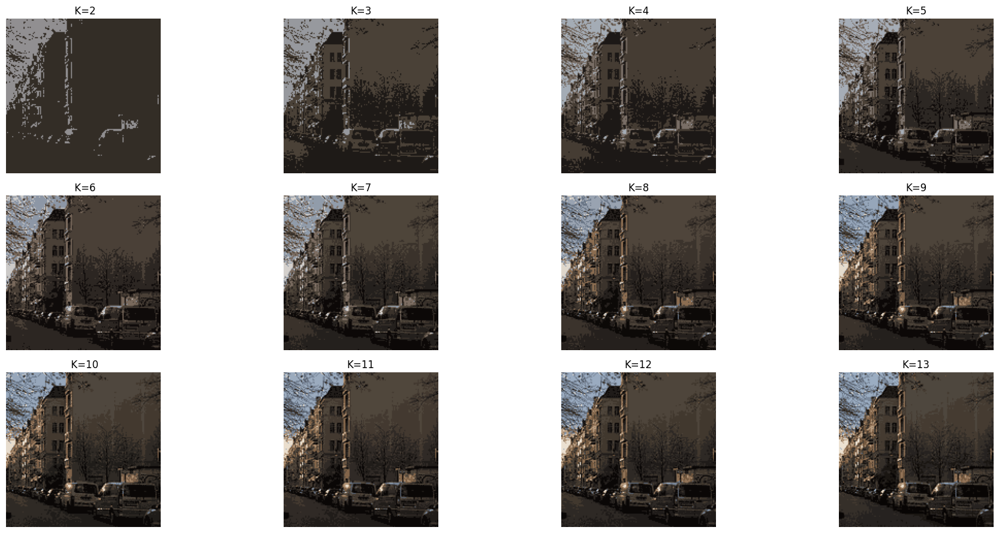

In [66]:
chooseK(coloredImages[0])

#### ***in first image as we can see k-means clustering with k = 5 represented the image almost close to the original image so we choose 5***
***

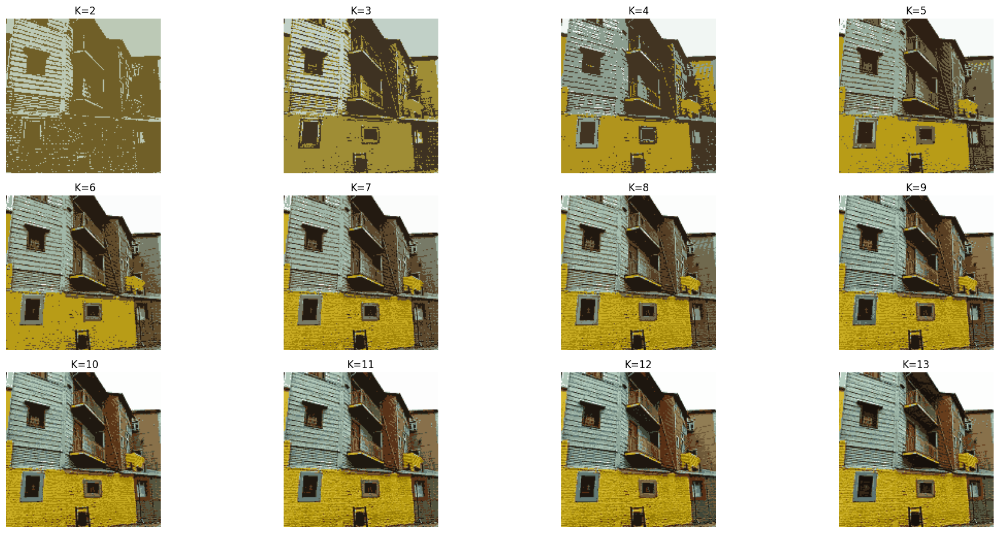

In [67]:
chooseK(coloredImages[1])

#### ***In this image k = 7 is a good parameter for the k-means clustering***

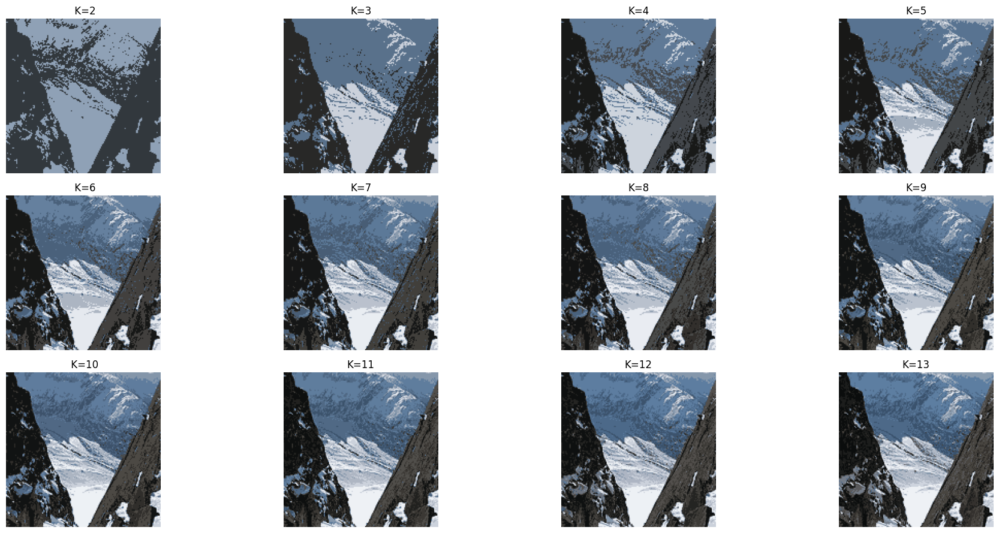

In [68]:
chooseK(coloredImages[2])

#### ***result: k=4***

***

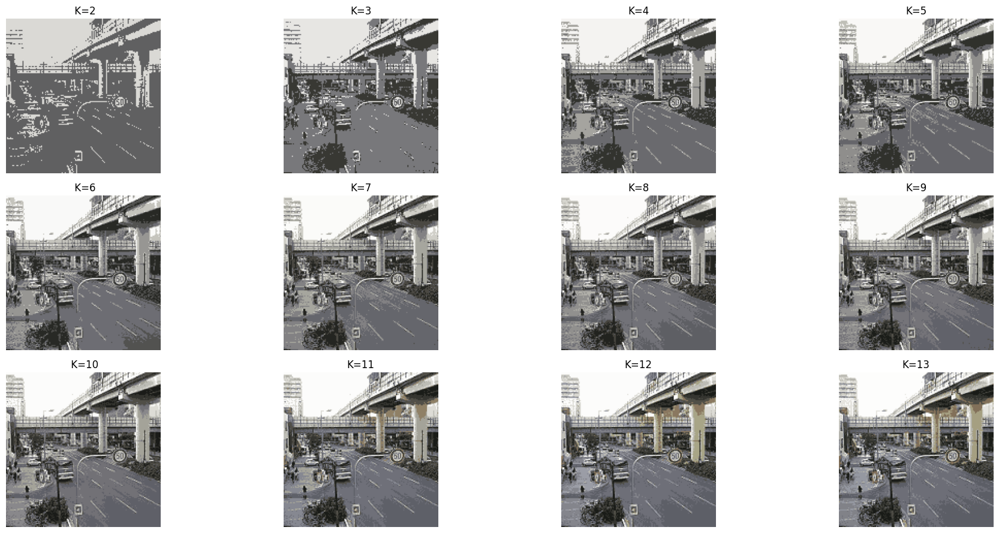

In [69]:
chooseK(coloredImages[3])

#### ***Result: k=7 (it does not get the colors right)*** 
***

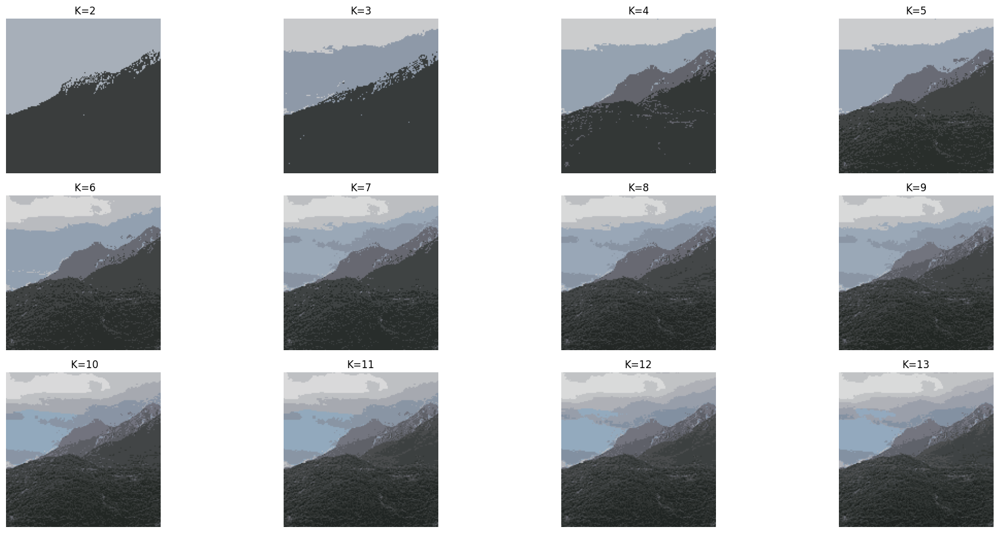

In [70]:
chooseK(coloredImages[4])

#### ***Since there is a lot of close colors in this image in the sky and the mountains higher amount of k is better so i choose k=13***
***

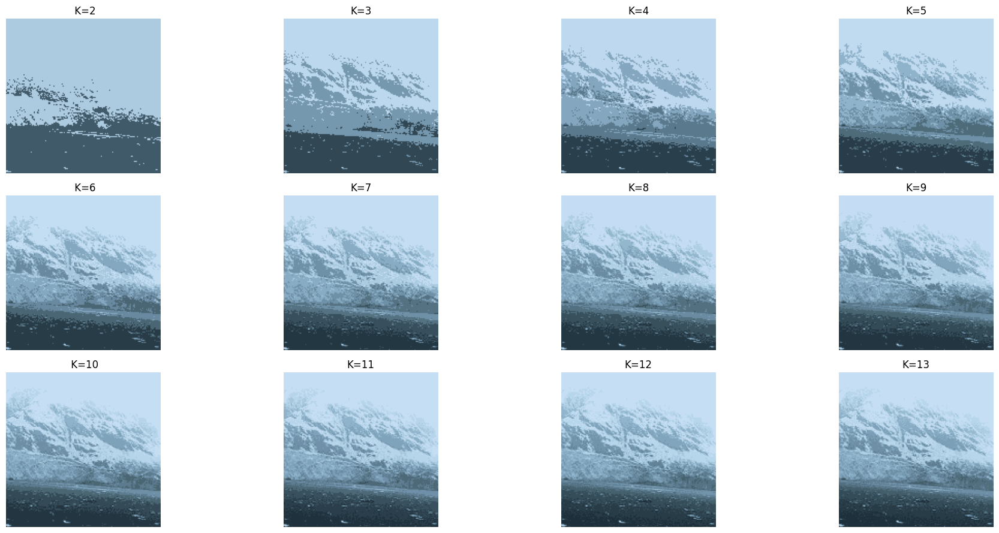

In [71]:
chooseK(coloredImages[5])

#### ***Result: k=7***
***

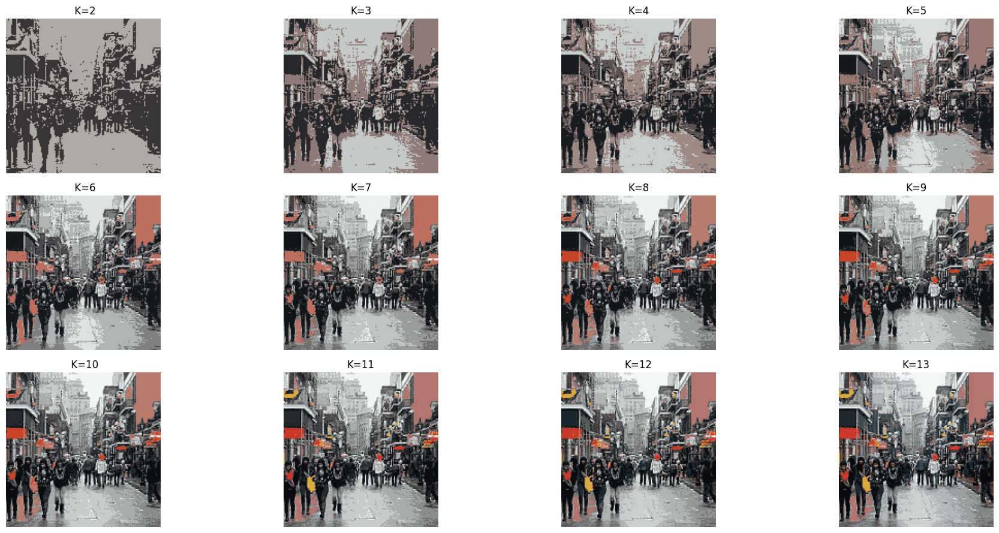

In [72]:
chooseK(coloredImages[6])

#### ***Result: k=13 (for colored image)***
***

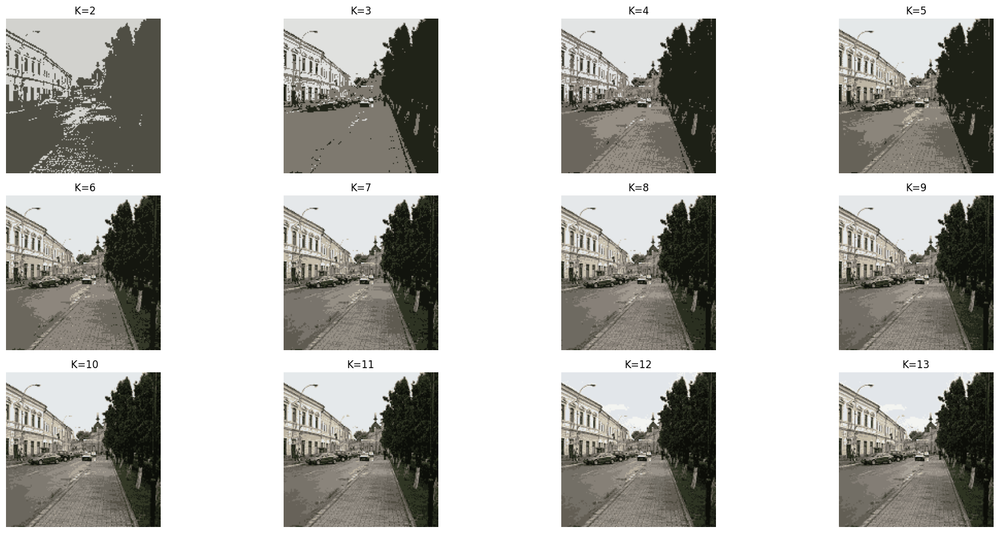

In [73]:
chooseK(coloredImages[7])

#### ***Result: k=6***
***

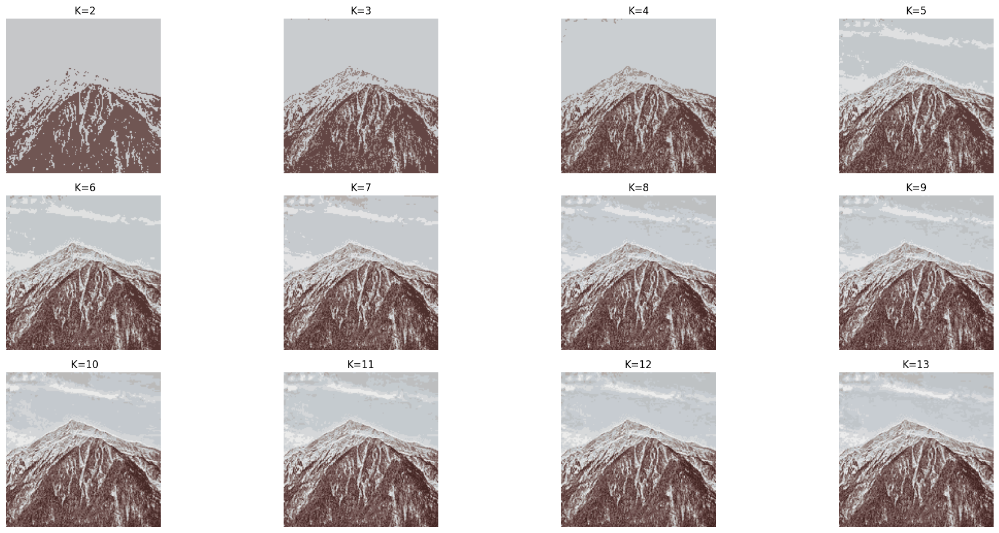

In [74]:
chooseK(coloredImages[8])

#### ***Result: k=3***
***

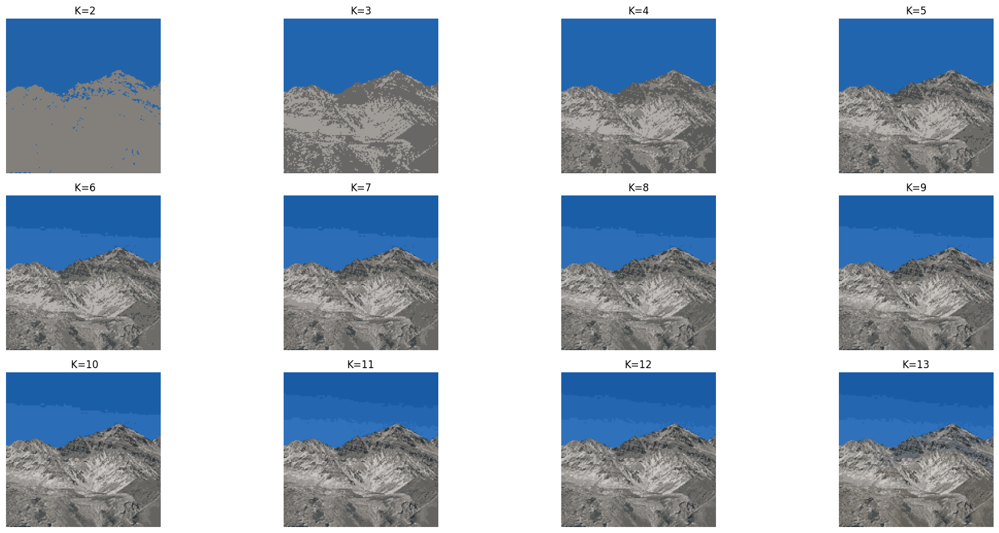

In [75]:
chooseK(coloredImages[9])

#### ***Result: k=5***
***

#### ***As we can see for most of the images k=7 is a good parameter and can regenarate the image well but for simpler images we can choose lower k (for example 3) and for complicated pictures even k=13 is still not good enough***